In [7]:
from keras import models
from keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

from keras.models import load_model

model = load_model('cats_and_dogs_small_2.h5')





In [8]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 15, 15, 128)      

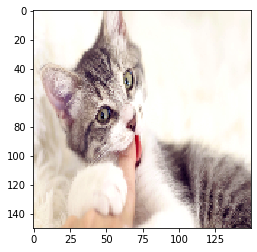

[0.00516588]
고양이




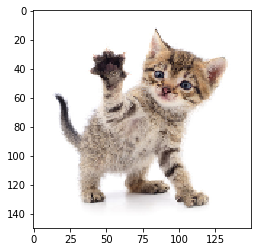

[0.03897858]
고양이




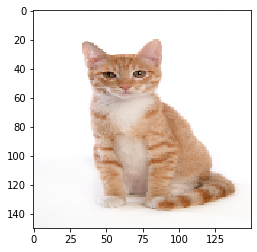

[0.01360683]
고양이




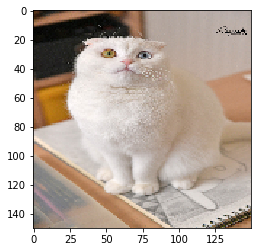

[0.03250265]
고양이




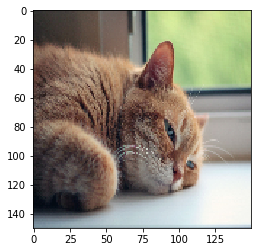

[0.15803047]
고양이




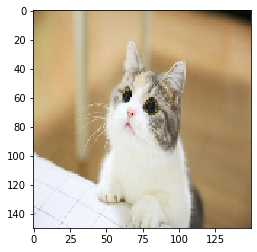

[0.03253752]
고양이




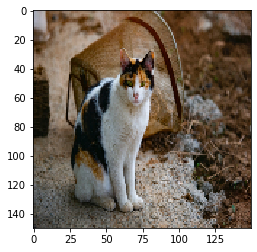

[0.8766584]
개




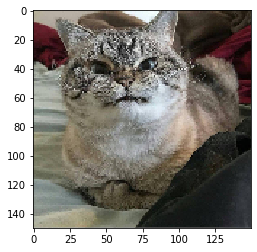

[0.0039043]
고양이




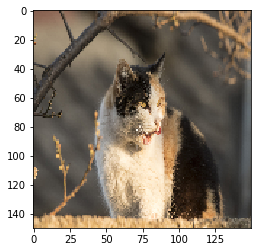

[0.5108721]
개




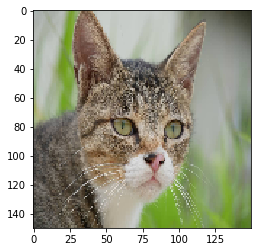

[0.01298325]
고양이




In [9]:
for i in range(0,10):
    img_path = './dataset/ex/cat/cat0000'+ str(i) + '.jpg'
        
    img = image.load_img(img_path, target_size = (150, 150))
        
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis = 0)
    x /= 255.
    x = x.astype('float32')
        
    preds = model.predict(x)
    
    plt.imshow(x[0])
    plt.show()
    print(preds.flatten())
    print("개" if preds.flatten() > 0.5 else "고양이")
    print('\n')        

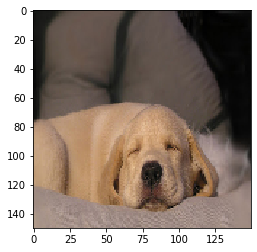

[0.41380256]
고양이




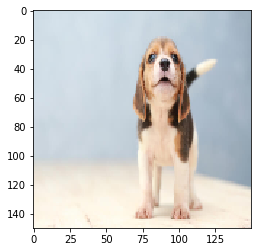

[0.8781548]
개




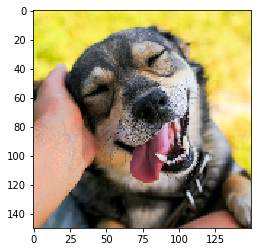

[0.85679376]
개




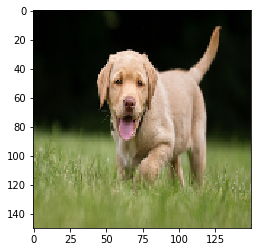

[0.9999484]
개




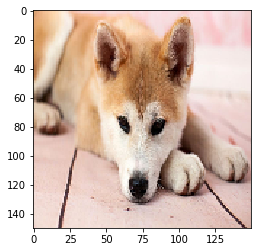

[0.98879576]
개




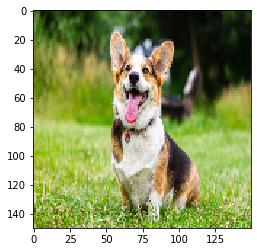

[0.9999999]
개




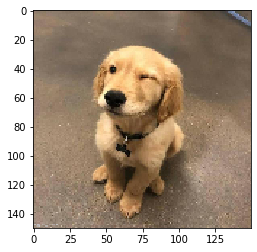

[0.99562377]
개




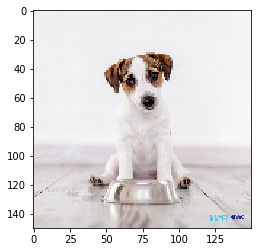

[0.193007]
고양이




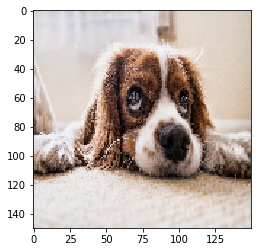

[0.5758386]
개




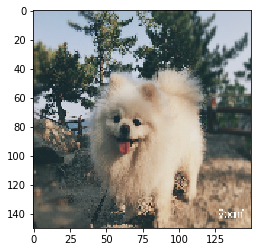

[0.58396393]
개




In [10]:
for i in range(0,10):
    img_path = './dataset/ex/dog/dog0000'+ str(i) + '.jpg'
        
    img = image.load_img(img_path, target_size = (150, 150))
        
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis = 0)
    x /= 255.
        
    preds = model.predict(x)
    
    plt.imshow(x[0])
    plt.show()
    print(preds.flatten())
    print("개" if preds.flatten() > 0.5 else "고양이")
    print('\n')        



/Users/monireu/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in true_divide


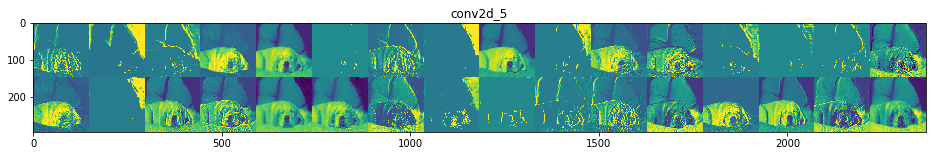

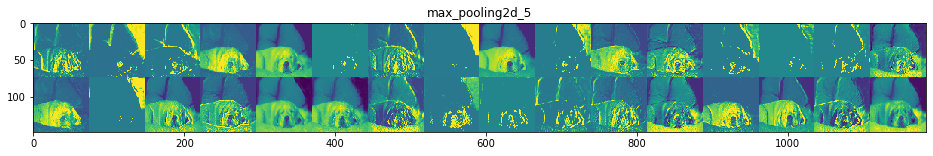

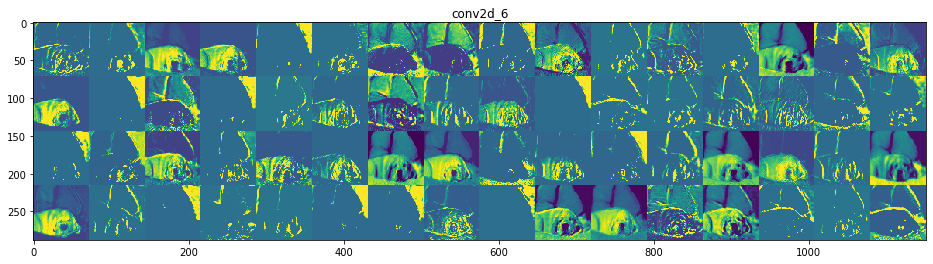

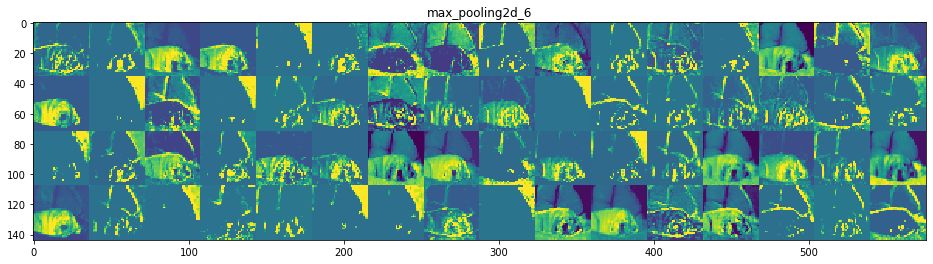

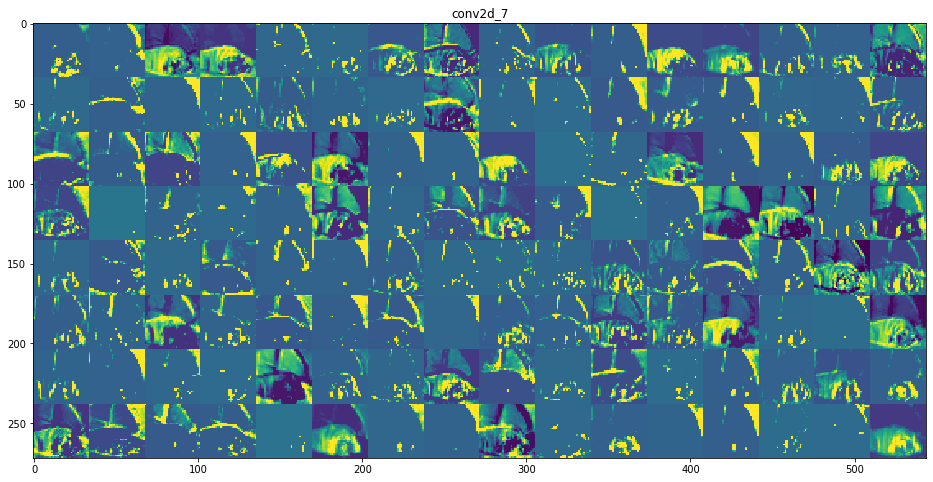

...

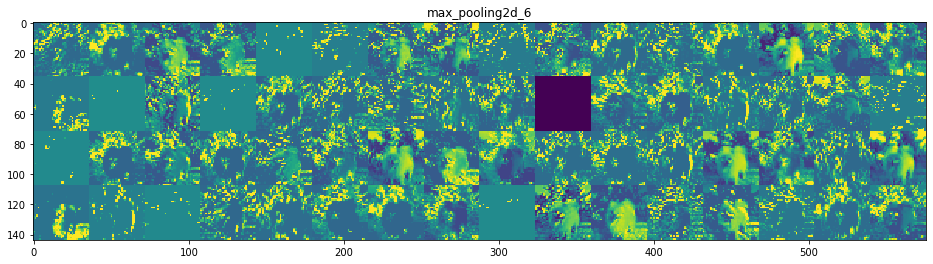

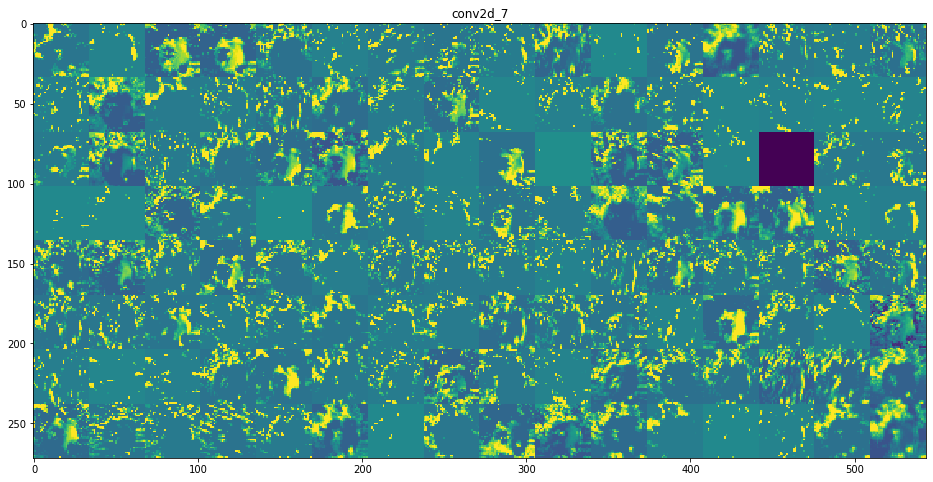

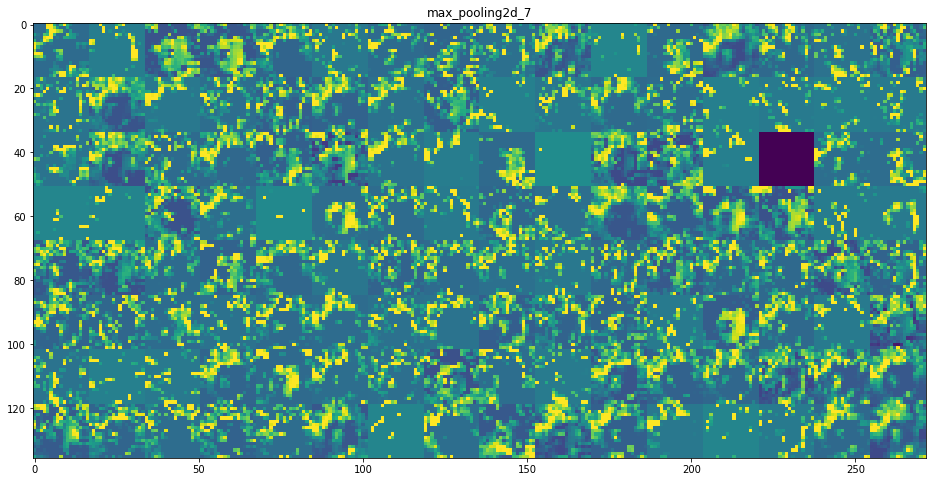

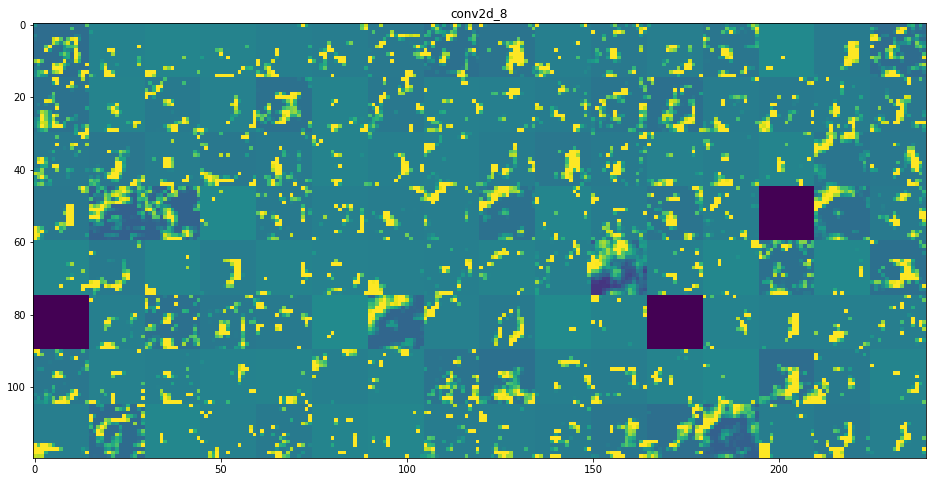

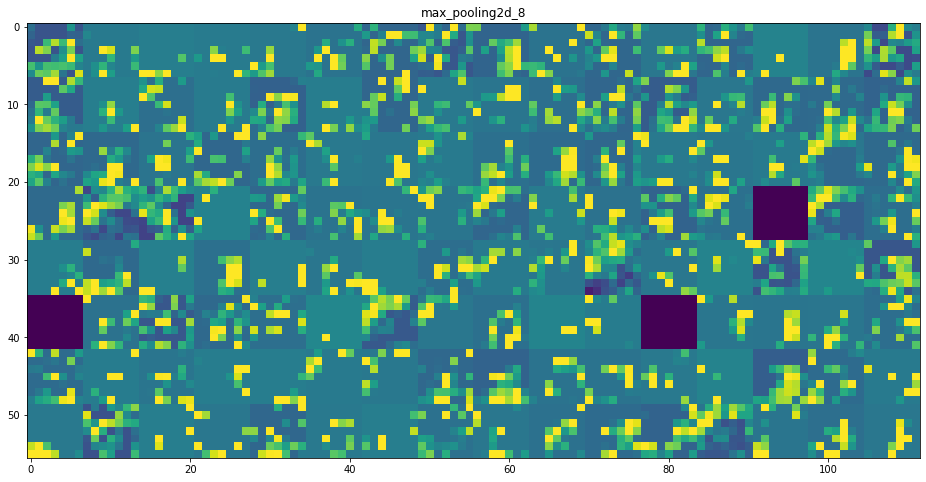

In [23]:
for i in range(0,10):
    img_path = './dataset/ex/dog/dog0000'+ str(i) + '.jpg'
        
    img = image.load_img(img_path, target_size = (150, 150))
        
    img_tensor = image.img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis = 0)
    img_tensor /= 255.
        
#     plt.imshow(x[0])
#     plt.show()        

    layer_outputs = [layer.output for layer in model.layers[0:8]]
    activation_model = models.Model(inputs=model.input, outputs=layer_outputs)
    
    activations = activation_model.predict(img_tensor)
    
    layer_names = []
    for layer in model.layers[0:8]:
        layer_names.append(layer.name)
        
    
    images_per_row = 16
    
    for layer_name, layer_activation in zip(layer_names, activations):
        n_features = layer_activation.shape[-1]
        
        size = layer_activation.shape[1]
        
        n_cols = n_features // images_per_row
        display_grid = np.zeros((size * n_cols, images_per_row * size))
        
        for col in range(n_cols):
            for row in range(images_per_row):
                channel_image = layer_activation[0,
                                                 :, :,
                                                 col * images_per_row + row]
                
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size,
                             row * size : (row + 1) * size] = channel_image
            
        scale = 1./size
        plt.figure(figsize=(scale * display_grid.shape[1],
                                scale * display_grid.shape[0]))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')

    plt.show()

In [41]:
from keras import backend as K

layer_name = 'conv2d_8'
filter_index = 0

# layer_output = model.get_layer(layer_name).output
# loss = K.mean(layer_output[:, :, :, filter_index])

# grads = K.gradients(loss, model.input)[0]
# grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

# iterate = K.function([model.input], [loss, grads])

# loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])

# input_image_data = np.random.random((1, 150, 150, 3)) * 20 + 128.

# step = 1.
# for i in range(40):
#     loss_value, grads_value = iterate([input_img_data])
#     input_img_data += grads_value * step
    
def deprocess_image(x):
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1
    
    x += 0.5
    x = np.clip(x, 0, 1)
    
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

def generate_pattern(layer_name, filter_index, size=150):
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])
    
    grads = K.gradients(loss, model.input)[0]
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    iterate = K.function([model.input], [loss, grads])
    
    loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])
    
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.
    
    
    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
    
    img = input_img_data[0]
    return deprocess_image(img)
    

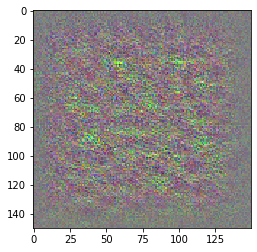

In [42]:
plt.imshow(generate_pattern(layer_name, filter_index))

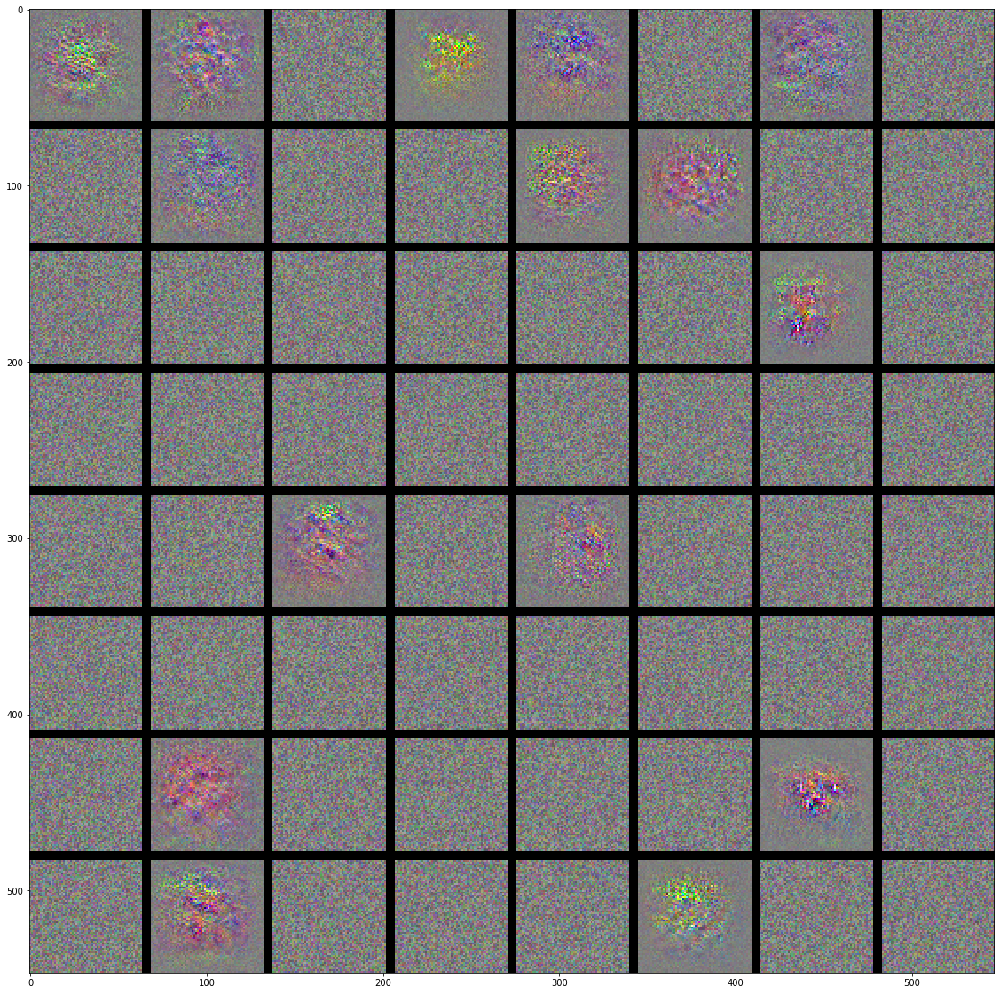

In [44]:
layer_name = 'conv2d_8'
size = 64
margin = 5

results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3), dtype='uint8')

for i in range(8):
    for j in range(8):
        filter_img = generate_pattern(layer_name, i + (j * 8), size = size)
        
        horizontal_start = i * size + i * margin
        horizontal_end = horizontal_start + size
        
        vertical_start = j * size + j * margin
        vertical_end = vertical_start + size
        
        results[horizontal_start: horizontal_end,
                vertical_start: vertical_end, :] = filter_img
        

plt.figure(figsize=(20,20))
plt.imshow(results)

In [52]:
import cv2

for i in range(1,10):
    img_path = './dataset/ex/dog/dog0000'+ str(i) + '.jpg'
        
    img = image.load_img(img_path, target_size = (150, 150))
        
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis = 0)
    x /= 255.
        
    preds = model.predict(x)
    
#     plt.imshow(x[0])
#     plt.show()       

    img_output = model.output[:, np.argmax(preds[0])]
    
    last_conv_layer = model.get_layer('conv2d_8')
    
    grads = K.gradients(img_output, last_conv_layer.output)[0]
    
    pooled_grads = K.mean(grads, axis=(0, 1, 2))
    
    iterate = K.function([model.input],
                         [pooled_grads, last_conv_layer.output[0]])
    
    pooled_grads_value, conv_layer_output_value = iterate([x])
    
    for i in range(128):
        conv_layer_output_value[:, :, i] *= pooled_grads_value[i]
        
    heatmap = np.mean(conv_layer_output_value, axis=-1)
    
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
#     plt.matshow(heatmap)
    


    img = cv2.imread(img_path)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = heatmap * 0.4 + img

    cv2.imwrite(img_path, superimposed_img)

TypeError: Image data of dtype <U29 cannot be converted to float

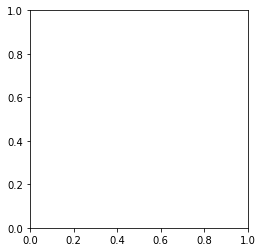

In [53]:
import cv2

for i in range(0,10):
    img_path = './dataset/ex/cat/cat0000'+ str(i) + '.jpg'
        
    img = image.load_img(img_path, target_size = (150, 150))
        
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis = 0)
    x /= 255.
        
    preds = model.predict(x)
    
#     plt.imshow(x[0])
#     plt.show()       

    img_output = model.output[:, np.argmax(preds[0])]
    
    last_conv_layer = model.get_layer('conv2d_8')
    
    grads = K.gradients(img_output, last_conv_layer.output)[0]
    
    pooled_grads = K.mean(grads, axis=(0, 1, 2))
    
    iterate = K.function([model.input],
                         [pooled_grads, last_conv_layer.output[0]])
    
    pooled_grads_value, conv_layer_output_value = iterate([x])
    
    for i in range(128):
        conv_layer_output_value[:, :, i] *= pooled_grads_value[i]
        
    heatmap = np.mean(conv_layer_output_value, axis=-1)
    
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
#     plt.matshow(heatmap)
    


    img = cv2.imread(img_path)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = heatmap * 0.4 + img

    cv2.imwrite(img_path, superimposed_img)